In [10]:
# Modules
import numpy as np
import pandas as pd
import scipy
from math import sqrt
import matplotlib.pyplot as plt
import seaborn as sns

#estimators
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn import linear_model

#model metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import cross_val_score


#cross validation
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import OrdinalEncoder
#Model Choice
modelSVR = SVR()
modelRF = RandomForestRegressor()
modelLR = LinearRegression()
#model = linear_model.LinearRegression()

In [13]:
#
rawData= pd.read_csv ('credit2.csv', header=0)
rawData.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1.0,20000,female,university,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,default
1,2.0,120000,female,university,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,default
2,3.0,90000,female,university,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,not default
3,4.0,50000,female,university,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,not default
4,5.0,50000,male,university,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,not default


In [14]:
rawData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29999 entries, 0 to 29998
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          29999 non-null  float64
 1   LIMIT_BAL                   29999 non-null  int64  
 2   SEX                         29999 non-null  object 
 3   EDUCATION                   29999 non-null  object 
 4   MARRIAGE                    29999 non-null  int64  
 5   AGE                         29999 non-null  int64  
 6   PAY_0                       29999 non-null  int64  
 7   PAY_2                       29999 non-null  int64  
 8   PAY_3                       29999 non-null  int64  
 9   PAY_4                       29999 non-null  int64  
 10  PAY_5                       29999 non-null  int64  
 11  PAY_6                       29999 non-null  int64  
 12  BILL_AMT1                   29999 non-null  int64  
 13  BILL_AMT2                   299

In [15]:
# Rename the columns
rawData = rawData.rename(columns={"default payment next month": "Default"})
rawData.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Default
0,1.0,20000,female,university,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,default
1,2.0,120000,female,university,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,default
2,3.0,90000,female,university,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,not default
3,4.0,50000,female,university,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,not default
4,5.0,50000,male,university,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,not default


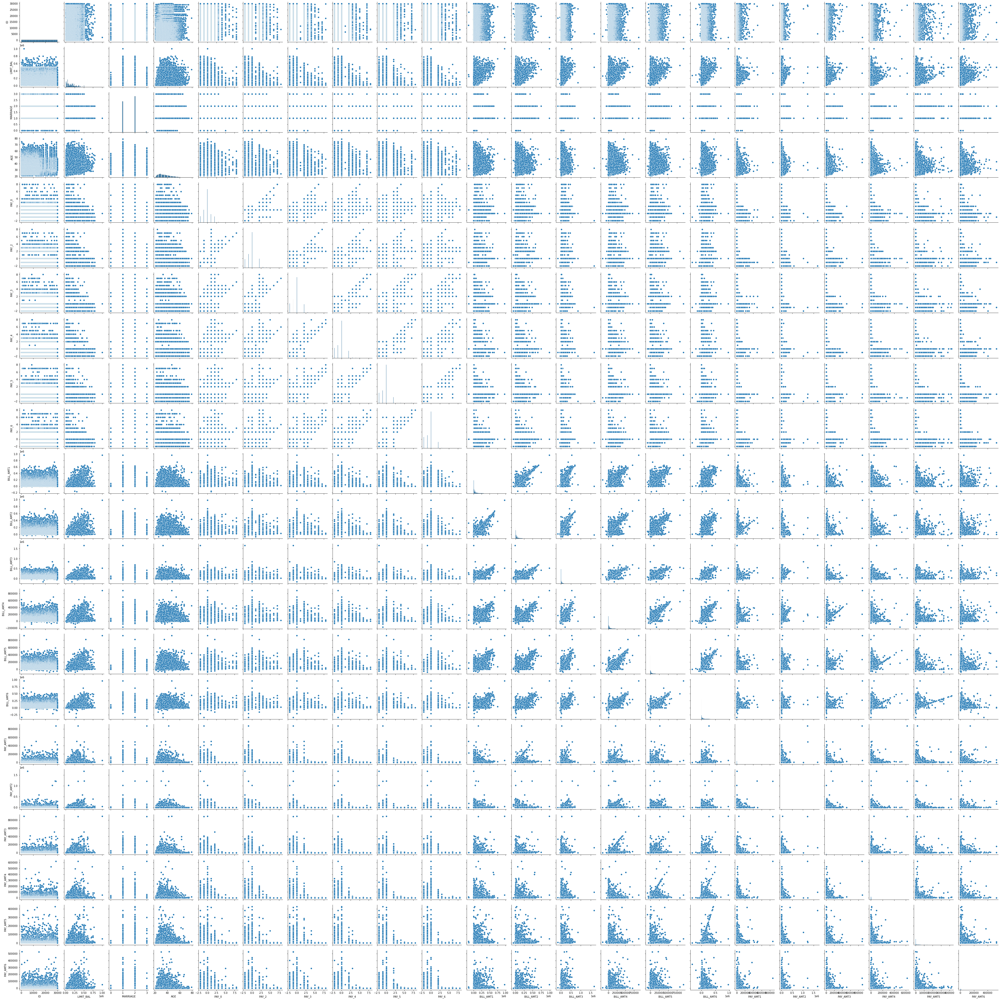

In [9]:
sns.pairplot(rawData)

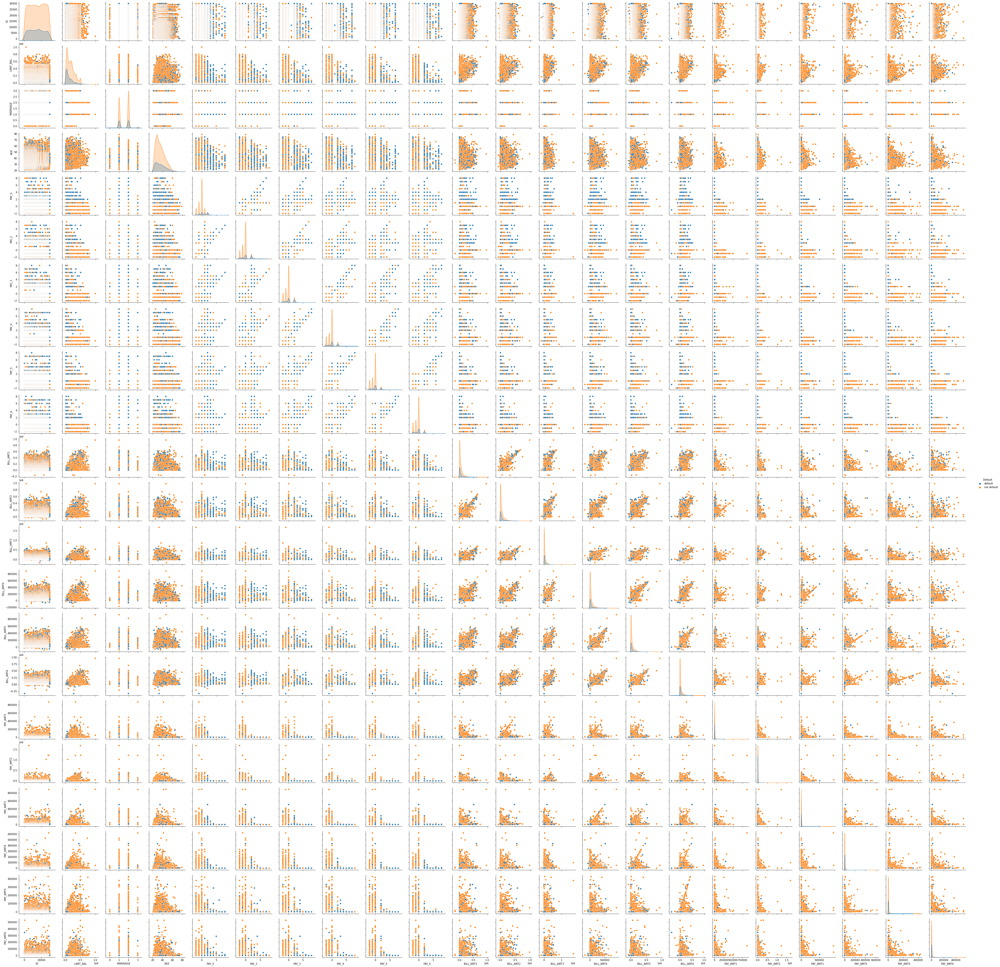

In [10]:
sns.pairplot(rawData, hue= "Default")

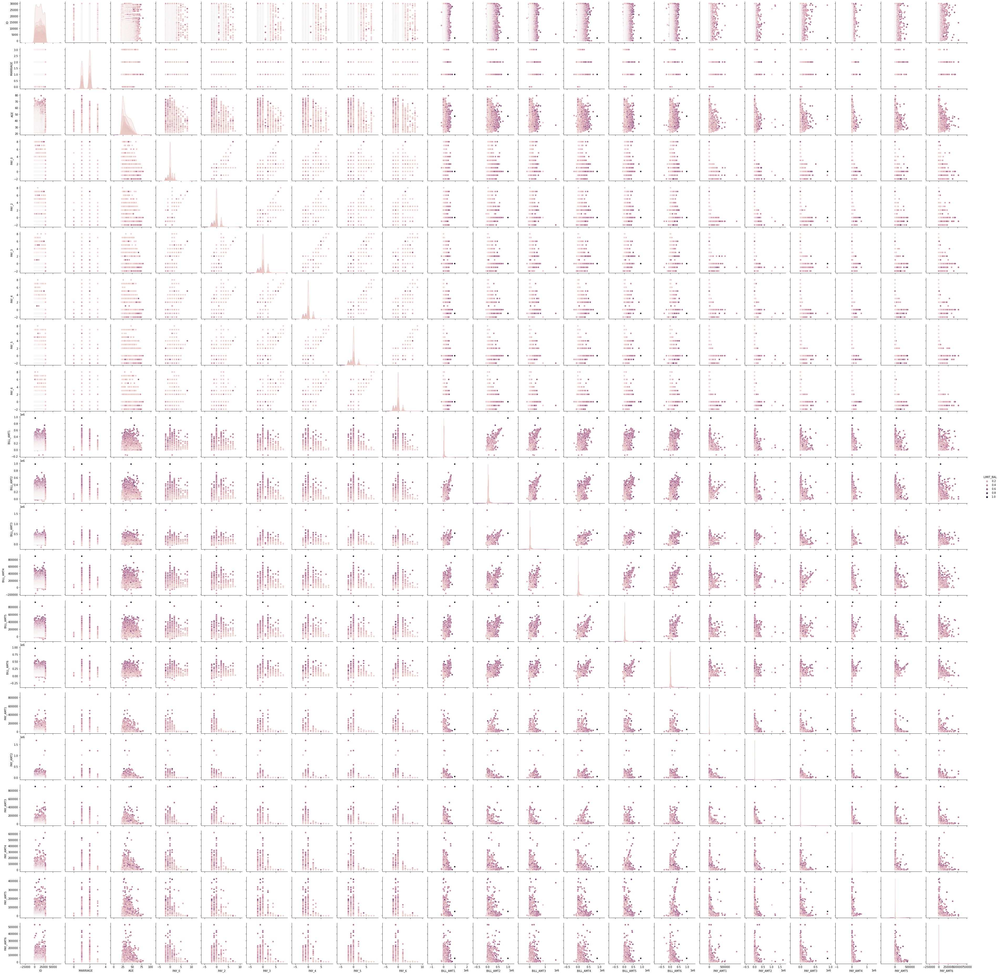

In [11]:
sns.pairplot(rawData, hue="LIMIT_BAL")

In [16]:
from sklearn.preprocessing import OrdinalEncoder
enc= OrdinalEncoder()
rawData[["SEX","EDUCATION"]]=enc.fit_transform(rawData[ ["SEX", "EDUCATION"]])
rawData.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Default
0,1.0,20000,0.0,3.0,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,default
1,2.0,120000,0.0,3.0,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,default
2,3.0,90000,0.0,3.0,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,not default
3,4.0,50000,0.0,3.0,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,not default
4,5.0,50000,1.0,3.0,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,not default


In [17]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
rawData ['Default'] = le. fit_transform(rawData ['Default'])
rawData.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Default
0,1.0,20000,0.0,3.0,1,24,2,2,-1,-1,...,0,0,0,0,689,0,0,0,0,0
1,2.0,120000,0.0,3.0,2,26,-1,2,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,0
2,3.0,90000,0.0,3.0,2,34,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,1
3,4.0,50000,0.0,3.0,1,37,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,1
4,5.0,50000,1.0,3.0,1,57,-1,0,-1,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,1


In [18]:
rawData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29999 entries, 0 to 29998
Data columns (total 25 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ID         29999 non-null  float64
 1   LIMIT_BAL  29999 non-null  int64  
 2   SEX        29999 non-null  float64
 3   EDUCATION  29999 non-null  float64
 4   MARRIAGE   29999 non-null  int64  
 5   AGE        29999 non-null  int64  
 6   PAY_0      29999 non-null  int64  
 7   PAY_2      29999 non-null  int64  
 8   PAY_3      29999 non-null  int64  
 9   PAY_4      29999 non-null  int64  
 10  PAY_5      29999 non-null  int64  
 11  PAY_6      29999 non-null  int64  
 12  BILL_AMT1  29999 non-null  int64  
 13  BILL_AMT2  29999 non-null  int64  
 14  BILL_AMT3  29999 non-null  int64  
 15  BILL_AMT4  29999 non-null  int64  
 16  BILL_AMT5  29999 non-null  int64  
 17  BILL_AMT6  29999 non-null  int64  
 18  PAY_AMT1   29999 non-null  int64  
 19  PAY_AMT2   29999 non-null  int64  
 20  PAY_AM

In [21]:
#features
X=rawData.iloc[:,[2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]]
print('Summary of feature sample')
X.head()

Summary of feature sample


,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Default
0,0.0,3.0,1,24,2,2,-1,-1,-2,-2,...,0,0,0,0,689,0,0,0,0,0
1,0.0,3.0,2,26,-1,2,0,0,0,2,...,3272,3455,3261,0,1000,1000,1000,0,2000,0
2,0.0,3.0,2,34,0,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,1
3,0.0,3.0,1,37,0,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,1
4,1.0,3.0,1,57,-1,0,-1,0,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,1


In [22]:
#dependent variable
depVar = rawData['LIMIT_BAL']

In [24]:
#Training Set (Feature Space: X Training)
X_train = (X[:-100])
#feature_train_count = len(features_train.index)
#print('The number of observations in the X training set is:',str(feature_train_count))
X_train.head()

,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Default
0,0.0,3.0,1,24,2,2,-1,-1,-2,-2,...,0,0,0,0,689,0,0,0,0,0
1,0.0,3.0,2,26,-1,2,0,0,0,2,...,3272,3455,3261,0,1000,1000,1000,0,2000,0
2,0.0,3.0,2,34,0,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,1
3,0.0,3.0,1,37,0,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,1
4,1.0,3.0,1,57,-1,0,-1,0,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,1


In [83]:
#Dependent Variable Training Set (y Training)
y_train = depVar[:]
#depVar_test=depVar[:]
y_train_count = len(y_train.index)
print('The number of observations in the Y training set are:',str(y_train_count))
y_train.head()

The number of observations in the Y training set are: 29999


0     20000
1    120000
2     90000
3     50000
4     50000
Name: LIMIT_BAL, dtype: int64

In [84]:
#Testing Set (X Testing)
X_test = X[:]
X_test_count = len(X_test.index)
print('The number of observations in the feature testing set is:',str(X_test_count))
print(X_test.head())

The number of observations in the feature testing set is: 29999
   LIMIT_BAL  Default
0      20000        0
1     120000        0
2      90000        1
3      50000        1
4      50000        1


In [85]:
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=100, test_size=0.3)
X_train.shape, X_test.shape

((20999, 2), (9000, 2))

In [86]:
#Random Forest Regression Model
modelRF.fit(X_train,y_train)
print(cross_val_score(modelRF, X_train, y=y_train))
#modelRF.score(X_train,y_train)

[0.02185144 0.01124364 0.01111195 0.01249967 0.01546014]


In [27]:
# Support Vector Regression Model 
modelSVR.fit(X_train,y_train)
print(cross_val_score(modelSVR, X_train, y_train)) 
modelSVR.score(X_train,y_train)

[-0.04690579 -0.04962507 -0.03948252 -0.02819492 -0.03705377]


-0.03886965732425418

In [28]:
# Linear Regression Model 
modelLR.fit(X_train,y_train)
print(cross_val_score(modelLR, X_train, y_train)) 
modelLR.score(X_train,y_train)

[0.34536029 0.36731123 0.35086323 0.30040574 0.33703545]


0.34609693325140445

In [29]:
#Model Performance
rSquared = modelRF.score(X_train,y_train)
mse = np.mean((modelRF.predict(X_test) - y_test) ** 2)

In [87]:
print('Mean squared error: %.2f' % mse )
print('R Squared of training: %.2f' % rSquared)

Mean squared error: 13870017971.72
R Squared of training: 0.54


In [31]:
#Make Predictions
predictions = modelRF.predict(X_test)
predRsquared = r2_score(y_test,predictions)
rmse = sqrt(mean_squared_error(y_test, predictions))
print('R Squared: %.3f' % predRsquared)
print('RMSE: %.3f' % rmse)

R Squared: 0.465
RMSE: 95406.662


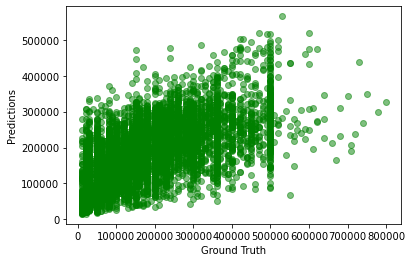

In [32]:
#plt.scatter(features_test, depVar_test,  color='black')
plt.scatter(y_test, predictions, color= ['green'], alpha = 0.5)
plt.xlabel('Ground Truth')
plt.ylabel('Predictions')
plt.show();

In [88]:
#features
X=rawData.iloc[:,[2,3,4,5,6,7,8,9,10,11,12,13,14]]
print('Summary of feature sample')
X.head()

Summary of feature sample


,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3
0,0.0,3.0,1,24,2,2,-1,-1,-2,-2,3913,3102,689
1,0.0,3.0,2,26,-1,2,0,0,0,2,2682,1725,2682
2,0.0,3.0,2,34,0,0,0,0,0,0,29239,14027,13559
3,0.0,3.0,1,37,0,0,0,0,0,0,46990,48233,49291
4,1.0,3.0,1,57,-1,0,-1,0,0,0,8617,5670,35835


In [89]:
y= rawData['LIMIT_BAL']

In [90]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = .30, random_state = 123)
X_train.shape, y_train.shape
X_test.shape, y_test.shape


((9000, 13), (9000,))

In [91]:
#Random Forest Regrerssion Model
modelRF.fit(X_train,y_train)
print(cross_val_score(modelRF, X_train, y=y_train))
#modelRF.score(X_train,y_train)

[0.40310825 0.42103814 0.40360404 0.39550315 0.3880074 ]


In [92]:
# Support Vector Regression Model 
modelSVR.fit(X_train,y_train)
print(cross_val_score(modelSVR, X_train, y_train)) 
modelSVR.score(X_train,y_train)

[-0.0433382  -0.0437398  -0.03541272 -0.03829212 -0.04103668]


-0.0394792485995803

In [93]:
algosClass = []
algosClass.append(('Random Forest Regressor',RandomForestRegressor()))

algosClass.append(('Linear Regression',LinearRegression()))

algosClass.append(('Support Vector Regression',SVR()))

In [94]:
#regression
results = []
names = []
for name, model in algosClass:
    result = cross_val_score(model, X,y, cv=3, scoring='r2')
    names.append(name)
    results.append(result)
for i in range(len(names)):
    print(names[i],results[i].mean())

Random Forest Regressor 0.40795591810329684
Linear Regression 0.28923116755388173
Support Vector Regression -0.0509470536940814


In [36]:
RF=RandomForestRegressor()

In [37]:
model = RF.fit(X_train,y_train)

In [38]:
predictions = RF.predict(X_test)


In [39]:
rmse = sqrt(mean_squared_error(y_test, predictions))


In [40]:
#Make Predictions
predictions = model.predict(X_test)
predRsquared = r2_score(y_test,predictions)
rmse = sqrt(mean_squared_error(y_test, predictions))
print('R Squared: %.3f' % predRsquared)
print('RMSE: %.3f' % rmse)

R Squared: 0.155
RMSE: 117766.364


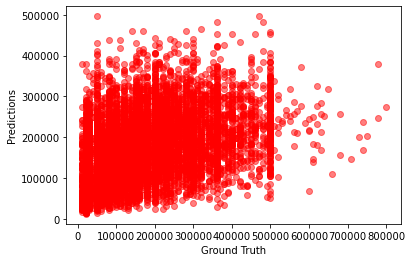

In [41]:
plt.scatter(y_test, predictions, color=['red'], alpha = 0.5)
plt.xlabel('Ground Truth')
plt.ylabel('Predictions')
plt.show();

In [49]:
#features
X=rawData.iloc[:,[2,3,4,5,6,7,8,9]]
print('Summary of feature sample')
X.head()

Summary of feature sample


,SEX,EDUCATION,MARRIAGE,AGE,PAY_0
0,0.0,3.0,1,24,2
1,0.0,3.0,2,26,-1
2,0.0,3.0,2,34,0
3,0.0,3.0,1,37,0
4,1.0,3.0,1,57,-1


In [45]:
y= rawData['Default']

In [46]:
#features
X=rawData.iloc[:,[1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24]]
print('Summary of feature sample')
X.head()

Summary of feature sample


,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,Default
0,20000,0.0,3.0,1,24,2,2,-1,-1,-2,...,0,0,0,0,689,0,0,0,0,0
1,120000,0.0,3.0,2,26,-1,2,0,0,0,...,3272,3455,3261,0,1000,1000,1000,0,2000,0
2,90000,0.0,3.0,2,34,0,0,0,0,0,...,14331,14948,15549,1518,1500,1000,1000,1000,5000,1
3,50000,0.0,3.0,1,37,0,0,0,0,0,...,28314,28959,29547,2000,2019,1200,1100,1069,1000,1
4,50000,1.0,3.0,1,57,-1,0,-1,0,0,...,20940,19146,19131,2000,36681,10000,9000,689,679,1


In [47]:
#Random Forest Regrerssion Model
modelRF.fit(X_train,y_train)
print(cross_val_score(modelRF, X_train, y=y_train))
#modelRF.score(X_train,y_train)

[0.16288676 0.16445398 0.16563471 0.12383215 0.15274798]


In [48]:
# Support Vector Regression Model 
modelSVR.fit(X_train,y_train)
print(cross_val_score(modelSVR, X_train, y_train)) 
modelSVR.score(X_train,y_train)

[-0.04580927 -0.0465284  -0.03773298 -0.04086797 -0.04351519]


-0.04257030394882522

In [49]:
# Linear Regression Model 
modelLR.fit(X_train,y_train)
print(cross_val_score(modelLR, X_train, y_train)) 
modelLR.score(X_train,y_train)

[0.13836063 0.17774284 0.13490012 0.14355589 0.15163285]


0.15019676614026556

In [50]:
#Model Performance
rSquared = modelRF.score(X_train,y_train)
mse = np.mean((modelRF.predict(X_test) - y_test) ** 2)

In [79]:
print('Mean squared error: %.2f' % mse)
print('R Squared of training: %.2f' % rSquared)

Mean squared error: 13870017971.72
R Squared of training: 0.54


In [62]:
#features
X = rawData.iloc[:,[1,24]]

print('Summary of feature sample')
X.head()

Summary of feature sample


,LIMIT_BAL,Default
0,20000,0
1,120000,0
2,90000,1
3,50000,1
4,50000,1


In [63]:
#Discretize Age
custom_bucket_array =[1,9,19,29,39,49,59,69,79,89]
rawData['Age_group']= pd.cut(rawData['AGE'], custom_bucket_array, labels = False)
rawData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29999 entries, 0 to 29998
Data columns (total 27 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   ID         29999 non-null  float64
 1   LIMIT_BAL  29999 non-null  int64  
 2   SEX        29999 non-null  float64
 3   EDUCATION  29999 non-null  float64
 4   MARRIAGE   29999 non-null  int64  
 5   AGE        29999 non-null  int64  
 6   PAY_0      29999 non-null  int64  
 7   PAY_2      29999 non-null  int64  
 8   PAY_3      29999 non-null  int64  
 9   PAY_4      29999 non-null  int64  
 10  PAY_5      29999 non-null  int64  
 11  PAY_6      29999 non-null  int64  
 12  BILL_AMT1  29999 non-null  int64  
 13  BILL_AMT2  29999 non-null  int64  
 14  BILL_AMT3  29999 non-null  int64  
 15  BILL_AMT4  29999 non-null  int64  
 16  BILL_AMT5  29999 non-null  int64  
 17  BILL_AMT6  29999 non-null  int64  
 18  PAY_AMT1   29999 non-null  int64  
 19  PAY_AMT2   29999 non-null  int64  
 20  PAY_AM

In [64]:
#dependent variable
y = rawData['Age_group']

In [65]:
algosClass = []
algosClass.append(('Random Forest Regressor',RandomForestRegressor()))

algosClass.append(('Linear Regression',LinearRegression()))

algosClass.append(('Support Vector Regression',SVR()))

In [66]:
#regression
results = []
names = []
for name, model in algosClass:
    result = cross_val_score(model, X,y, cv=3, scoring='r2')
    names.append(name)
    results.append(result)
for i in range(len(names)):
    print(names[i],results[i].mean())

Random Forest Regressor 0.015305943974210886
Linear Regression 0.017822305077405048
Support Vector Regression 0.0032356083205590247


In [68]:
RF=RandomForestRegressor()

In [69]:
model = RF.fit(X_train,y_train)

In [70]:
predictions = RF.predict(X_test)


In [71]:
rmse = sqrt(mean_squared_error(y_test, predictions))


In [72]:
#Make Predictions
predictions = model.predict(X_test)
predRsquared = r2_score(y_test,predictions)
rmse = sqrt(mean_squared_error(y_test, predictions))
print('R Squared: %.3f' % predRsquared)
print('RMSE: %.3f' % rmse)

R Squared: 0.154
RMSE: 117803.553


In [73]:
rSquared = modelRF.score(X_train,y_train)
mse = np.mean((modelRF.predict(X_test) - y_test) ** 2)

In [78]:
print('Mean squared error: %.2f' % mse)
print('R Squared of training: %.2f' % rSquared)

Mean squared error: 13870017971.72
R Squared of training: 0.54


In [ ]:
#dependent variable
y = rawData['De']